# OkCupid dating app data and sentiment alanysis
 
I chose a project about dating apps because it's quite personal topic for me. I have some experiance with various dating apps as I used them on and off mostly between 2018 and 2020. I tried a good few platforms that are out there and OkCupid was among them. I liked the idea that OkCupid users had to put at least some effort into writing in thier profile. I thoguht it would give a better feel about a person. 

Choosing this project I was curious about overall data. I only saw a small portion of people out there tat were recommended to me as a potential match. I wanted to know whether there are more men or women looking for a potetial match, what is the biggest user age group, are they more educated, smokers etc. All those elemnets and more play an imoprtant role when using dating apps and trying to find your perfect match. I also wanted to find out what people say in their essays. Is it just me being cranky thinking that the writing seems repetitive or it actully was the case? Are they trying to stay up- beat or I'd be able to spot some Negative Nancys out there? 
I also wanted to find out what the overall feel was about OkCupid app- hence scarppig the Reddit comments. Reddit is 
'social news aggregation, content rating, and discussion website' so I figured I'll find an iformative content there. 

This project conatins 3 parts:
Part 1. Exploring OkCupid users data.
Part 2. Exploring users essays through n-grams, most frequent words, Word Clouds and sentiment analysis with TextBolb and Vader.
Part 3. Scrapping sub-reddit OkCupid for comments between January 2020 and July 2021 and then text exploraion using techiques mentioned above. 

Data used in this project were from Kaggel: https://www.kaggle.com/andrewmvd/okcupid-profiles and also scarpped from OkCupid subreddit by me. 



## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import praw
import pandas_profiling
import seaborn as sns

import nltk
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob
from nltk.probability import FreqDist
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()
from PIL import Image 

from bs4 import BeautifulSoup
from wordcloud import WordCloud

from sklearn.model_selection import train_test_split

%matplotlib inline

C:\Users\marta.nawrocka\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\marta.nawrocka\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
# Importing OKCupid database
df= pd.read_csv('okcupid_profiles.csv')

In [3]:
#Showing firs 10 rows of the database
df.head(10)

,age,status,sex,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",...,about me: i would love to think that i was so...,currently working as an international agent fo...,making people laugh. ranting about a good salt...,"the way i look. i am a six foot half asian, ha...","books: absurdistan, the republic, of mice and ...",food. water. cell phone. shelter.,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet! you are ti...
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,...,i am a chef: this is what that means. 1. i am ...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories. my b...,NaN,NaN,i am very open and will share just about anyth...,NaN
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,...,"i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement conversation creation contemplation t...,NaN,viewing. listening. dancing. talking. drinking...,"when i was five years old, i was known as ""the...","you are bright, open, intense, silly, ironic, ..."
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,...,i work in a library and go to school. . .,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,"bataille, celine, beckett. . . lynch, jarmusch...",NaN,cats and german philosophy,NaN,NaN,you feel so inclined.
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",...,hey how's it going? currently vague on the pro...,work work work work + play,creating imagery to look at: http://bagsbrown....,i smile a lot and my inquisitive nature,"music: bands, rappers, musicians at the moment...",NaN,NaN,NaN,NaN,NaN
5,29,single,m,straight,average,mostly anything,socially,NaN,graduated from college/university,white,...,"i'm an australian living in san francisco, but...",building awesome stuff. figuring out what's im...,imagining random shit. laughing at aforementio...,i have a big smile. i also get asked if i'm we...,"books: to kill a mockingbird, lord of the ring...","like everyone else, i love my friends and fami...",what my contribution to the world is going to ...,out with my friends!,i cried on my first day at school because a bi...,you're awesome.
6,32,single,f,straight,fit,strictly anything,socially,never,graduated from college/university,"white, other",...,life is about the little things. i love to lau...,digging up buried treasure,frolicking witty banter using my camera to ext...,i am the last unicorn,i like books. ones with pictures. reading them...,laughter amazing people in my life color curio...,synchronicity there is this whole other realm...,plotting to take over the world with my army o...,my typical friday night,NaN
7,31,single,f,straight,average,mostly anything,socially,never,graduated from college/university,white,...,NaN,"writing. meeting new people, spending time wit...","remembering people's birthdays, sending cards,...",i'm rather approachable (a byproduct of being ...,"i like: alphabetized lists, aquariums, autobio...","friends, family, notebook/pen, books, music, t...",things that amuse and inspire me,out and about or relaxing at home with a good ...,NaN,NaN
8,24,single,f,straight,NaN,strictly anything,socially,NaN,graduated from college/uni

In [4]:
#Checking the shape of the databse. OkC database has 59946 rowns and 31 columns
df.shape

(59946, 31)

In [5]:
#Printing the names of the columns 
print(df.columns)

Index(['age', 'status', 'sex', 'orientation', 'body_type', 'diet', 'drinks',
       'drugs', 'education', 'ethnicity', 'height', 'income', 'job',
       'last_online', 'location', 'offspring', 'pets', 'religion', 'sign',
       'smokes', 'speaks', 'essay0', 'essay1', 'essay2', 'essay3', 'essay4',
       'essay5', 'essay6', 'essay7', 'essay8', 'essay9'],
      dtype='object')


In [6]:
df.rename(columns={"sex": "gender"}, inplace = True) # changing the name of a column to less harsh 'gender'

In [7]:
# Merging essay columns into one. In OkC app there are several questions to chose from to write more about yourself. 
#Because the databse doesn't include those questions I decided to mergae all essays into one. That's ok since I'm interested in genral 
#sentiment of the essays and word combinations people use when writing on dating apps. 
#Also, not everyone answers all the questions regarding themselves like 'diet' 'drinks' etc. since not all the questions are mandatory.
# I chose to leave NaN entries in the databse because I will still get other important inforamtions about the users even if they don't 
#provide all the aswers. 


df['essay']= df[df.columns[21:]].apply(lambda x: ''.join(x.dropna().astype(str)), axis =1)


In [8]:
#Checking if merging worked. Last column 'essay' has all the essays merged into one. 
df.head()

,age,status,gender,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,essay
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",...,currently working as an international agent fo...,making people laugh. ranting about a good salt...,"the way i look. i am a six foot half asian, ha...","books: absurdistan, the republic, of mice and ...",food. water. cell phone. shelter.,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet! you are ti...,about me: i would love to think that i was so...
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories. my b...,NaN,NaN,i am very open and will share just about anyth...,NaN,i am a chef: this is what that means. 1. i am ...
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,...,"i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement conversation creation contemplation t...,NaN,viewing. listening. dancing. talking. drinking...,"when i was five years old, i was known as ""the...","you are bright, open, intense, silly, ironic, ...","i'm not ashamed of much, but writing public te..."
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,...,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,"bataille, celine, beckett. . . lynch, jarmusch...",NaN,cats and german philosophy,NaN,NaN,you feel so inclined.,i work in a library and go to school. . .readi...
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",...,work work work work + play,creating imagery to look at: http://bagsbrown....,i smile a lot and my inquisitive nature,"music: bands, rappers, musicians at the moment...",NaN,NaN,NaN,NaN,NaN,hey how's it going? currently vague on the pro...


In [9]:
#Making a lost of columns I want to drop (all short essays that are now merged into one)
cols=list(range(21,31))
cols

[21, 22, 23, 24, 25, 26, 27, 28, 29, 30]

In [10]:
# Dropping the columns
df.drop(df.columns[cols], inplace=True, axis=1)

In [11]:
# Checking if the right columns have been removed. Yes. 
print(df.columns)

Index(['age', 'status', 'gender', 'orientation', 'body_type', 'diet', 'drinks',
       'drugs', 'education', 'ethnicity', 'height', 'income', 'job',
       'last_online', 'location', 'offspring', 'pets', 'religion', 'sign',
       'smokes', 'speaks', 'essay'],
      dtype='object')


In [12]:
df.head()

,age,status,gender,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,job,last_online,location,offspring,pets,religion,sign,smokes,speaks,essay
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",...,transportation,2012-06-28-20-30,"south san francisco, california","doesn't have kids, but might want them",likes dogs and likes cats,agnosticism and very serious about it,gemini,sometimes,english,about me: i would love to think that i was so...
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,...,hospitality / travel,2012-06-29-21-41,"oakland, california","doesn't have kids, but might want them",likes dogs and likes cats,agnosticism but not too serious about it,cancer,no,"english (fluently), spanish (poorly), french (...",i am a chef: this is what that means. 1. i am ...
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,...,NaN,2012-06-27-09-10,"san francisco, california",NaN,has cats,NaN,pisces but it doesn&rsquo;t matter,no,"english, french, c++","i'm not ashamed of much, but writing public te..."
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,...,student,2012-06-28-14-22,"berkeley, california",doesn't want kids,likes cats,NaN,pisces,no,"english, german (poorly)",i work in a library and go to school. . .readi...
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",...,artistic / musical / writer,2012-06-27-21-26,"san francisco, california",NaN,likes dogs and likes cats,NaN,aquarius,no,english,hey how's it going? currently vague on the pro...


### Exploring the data

In [13]:
df.dtypes

age              int64
status          object
gender          object
orientation     object
body_type       object
diet            object
drinks          object
drugs           object
education       object
ethnicity       object
height         float64
income           int64
job             object
last_online     object
location        object
offspring       object
pets            object
religion        object
sign            object
smokes          object
speaks          object
essay           object
dtype: object

In [15]:
#pip install pandas_profiling --upgrade

  Using cached pandas_profiling-3.6.6-py2.py3-none-any.whl (324 kB)
  Using cached ydata_profiling-4.5.1-py2.py3-none-any.whl (357 kB)
  Using cached visions-0.7.5-py3-none-any.whl (102 kB)
  Using cached phik-0.12.3-cp37-cp37m-win_amd64.whl (664 kB)
  Attempting uninstall: pandas_profiling
    Found existing installation: pandas-profiling 1.4.1
    Uninstalling pandas-profiling-1.4.1:
      Successfully uninstalled pandas-profiling-1.4.1
Note: you may need to restart the kernel to use updated packages.


In [14]:
report =pandas_profiling.ProfileReport(df) # exploring dataframe with Pandas Profiling 

In [15]:
display(report)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We got a basic insight of the data with Pandas Profiling. We can see that the avarage users are in their early 30s (32 being a mean age), educated, straight, liking both cats and dogs, agnostic. There are nearly 60000 users registered on the app when the data was collected, nearly 60% being men.

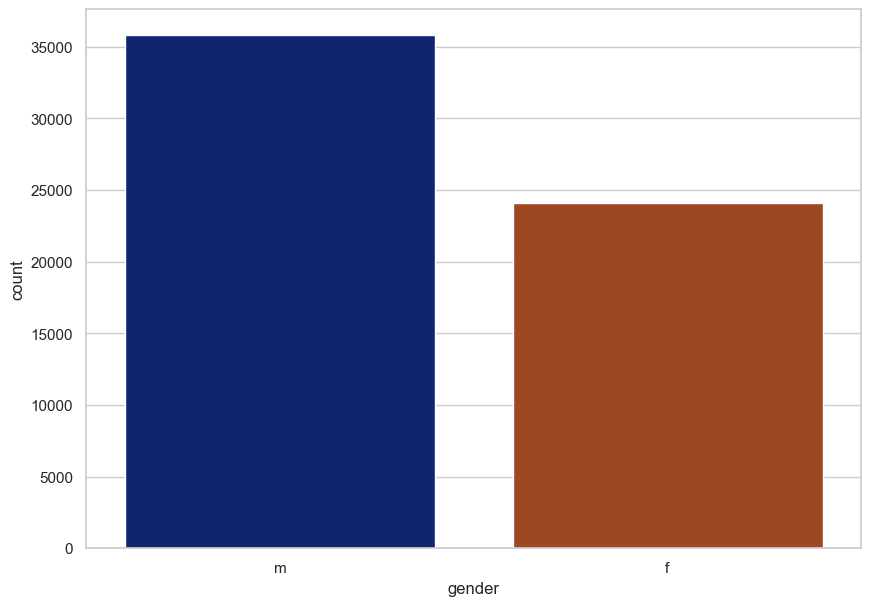

In [16]:
sns.set_theme(style='whitegrid')
plt.figure(figsize=(10, 7))
ax = sns.countplot(data=df, x=df['gender'], palette='dark')

Let's check the majority age group for both genders. 

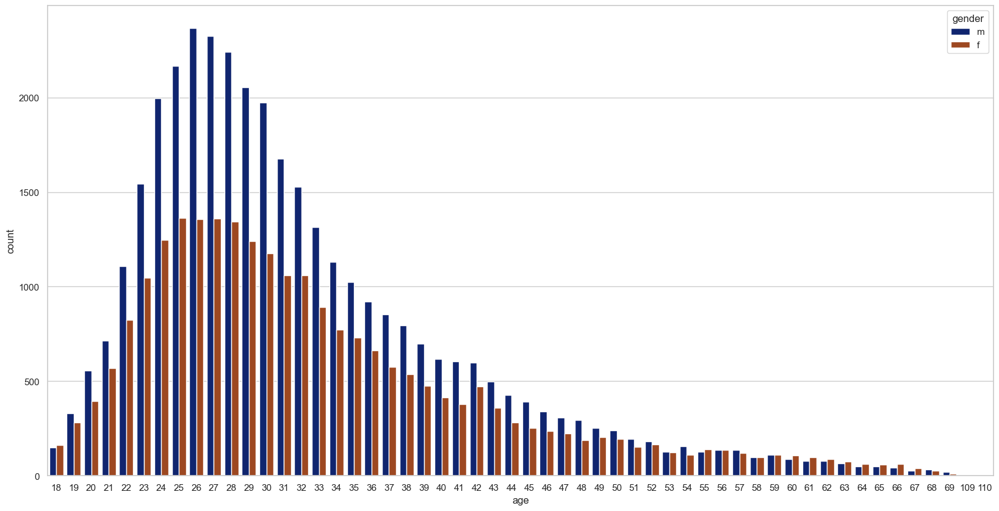

In [17]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(20, 10))
ax = sns.countplot(data=df, x=df['age'], hue=df['gender'], palette='dark')

 The majority users for both men and women are in their mid 20s to early 30s.

Now, let's check their relationship status. 

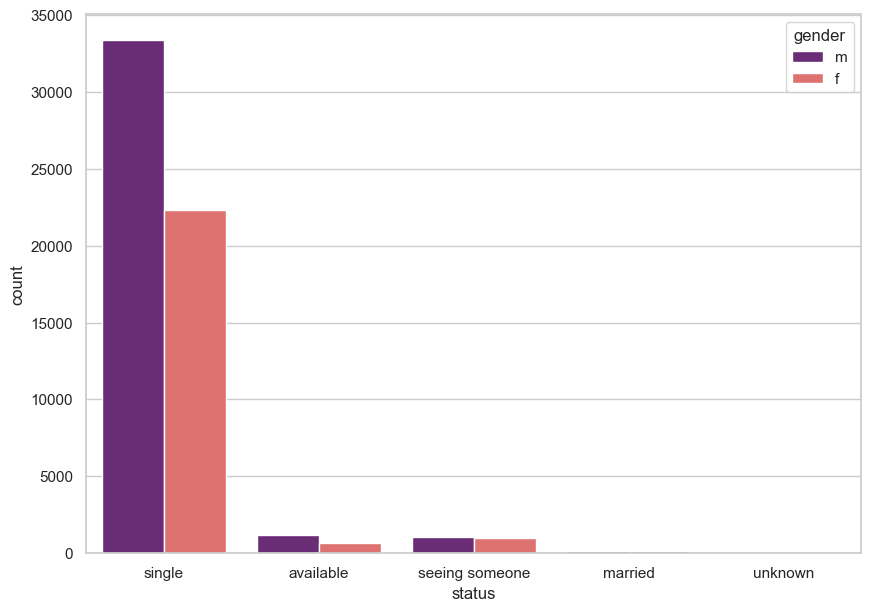

In [18]:
#Checking relationship status of people on OkC
sns.set_theme(style='whitegrid')
plt.figure(figsize=(10, 7))
ax = sns.countplot(data=df, x=df['status'], hue=df['gender'], palette='magma')

Mostly single men and women are using OkCupid. What's interesting is that roughly the same number of guys and women claim that they're seeing someone else. 

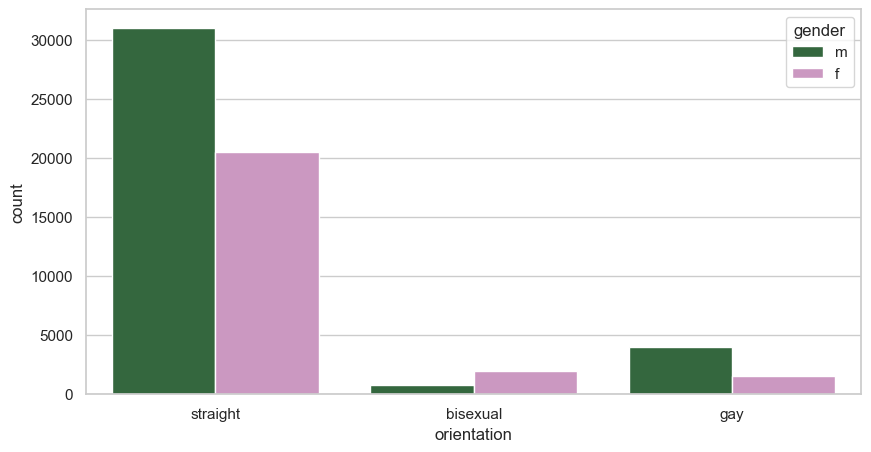

In [19]:
sns.set_theme(style='whitegrid')
plt.figure(figsize=(10, 5))
ax = sns.countplot(data=df, x=df['orientation'], hue=df['gender'], palette='cubehelix')

The majorty of people using the app are straight. It could be due to the fact that there are dating apps designed purpousely for gay people. The fact worth noticing is that more women say they're bisexusal.

Now let's explore the body type. 

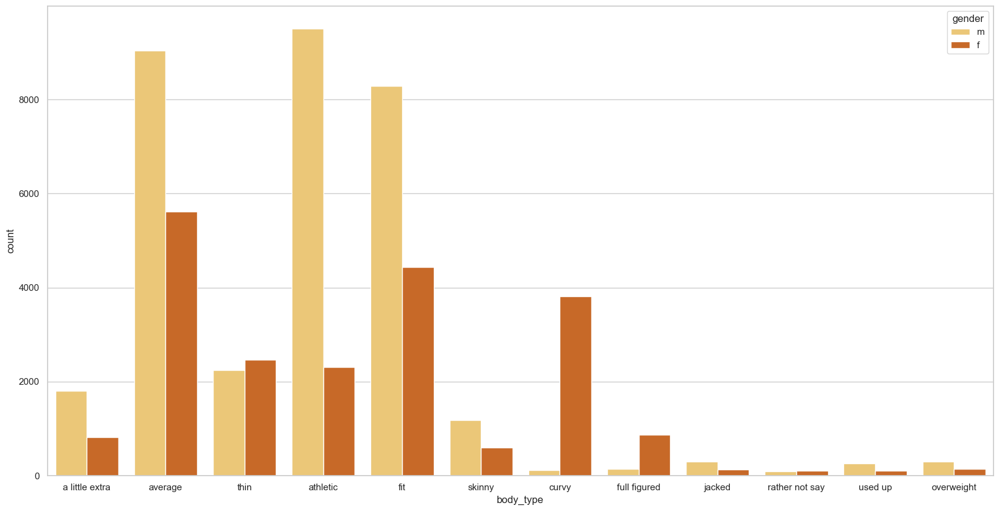

In [20]:
#Body type
sns.set_theme(style='whitegrid')
plt.figure(figsize=(20, 10))
ax = sns.countplot(data=df, x=df['body_type'], hue=df['gender'], palette='YlOrBr')

There are some intersting findings here. Majority of men say they have an 'athletic' body type. The second biggest body type is 'average', third being 'fit'. While majority of women say they're 'average' body type followed closely by 'fit' and then 'curvy'. When it comes to describing a body type, more women than men say they're 'curvy' or 'full figure' while men are prone to use a term 'a little extra'. There's a big gap between how many men and women call themselves 'athletic'. It seems to be more important to men to be 'athletic'. Also more women use a term 'thin'. Guys seem to go for 'skinny'. 

When it comes to drinking the biggest group is 'social' drinkers. The second biggest group is 'rarely' drinking people. More of them say the drink 'often' compared to 'not at all'. 'Desperatley' drinkers are the minority.

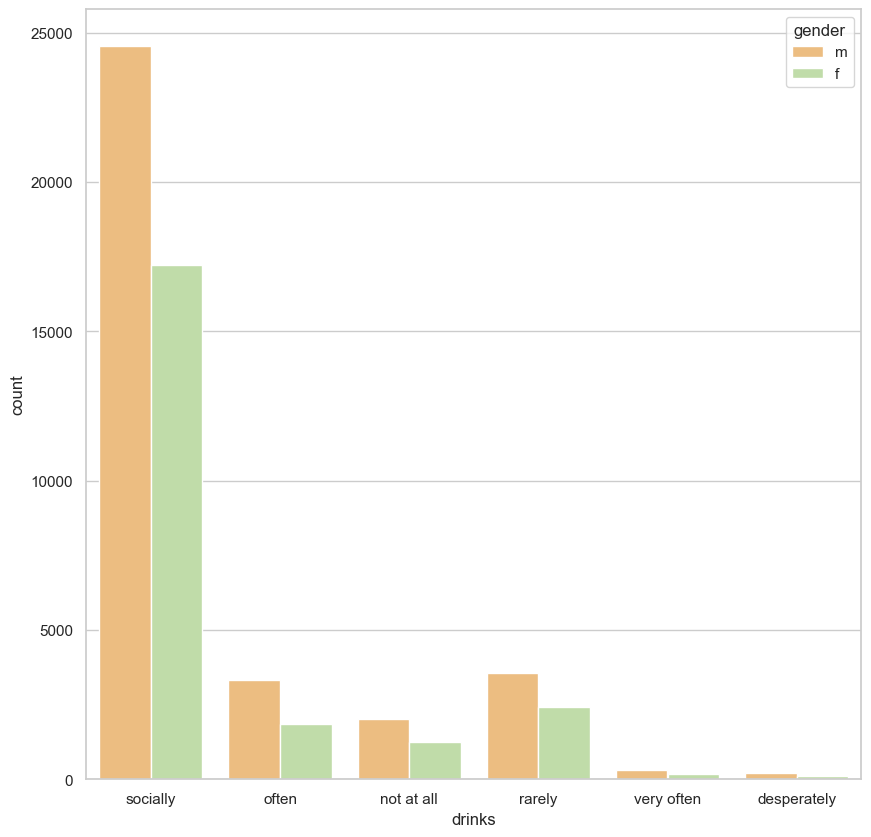

In [21]:
#Checking drinking habits 
sns.set_theme(style='whitegrid')
plt.figure(figsize=(10, 10))
ax = sns.countplot(data=df, x=df['drinks'], hue=df['gender'], palette='Spectral') 

Most people on the app have a drink 'socially'. 

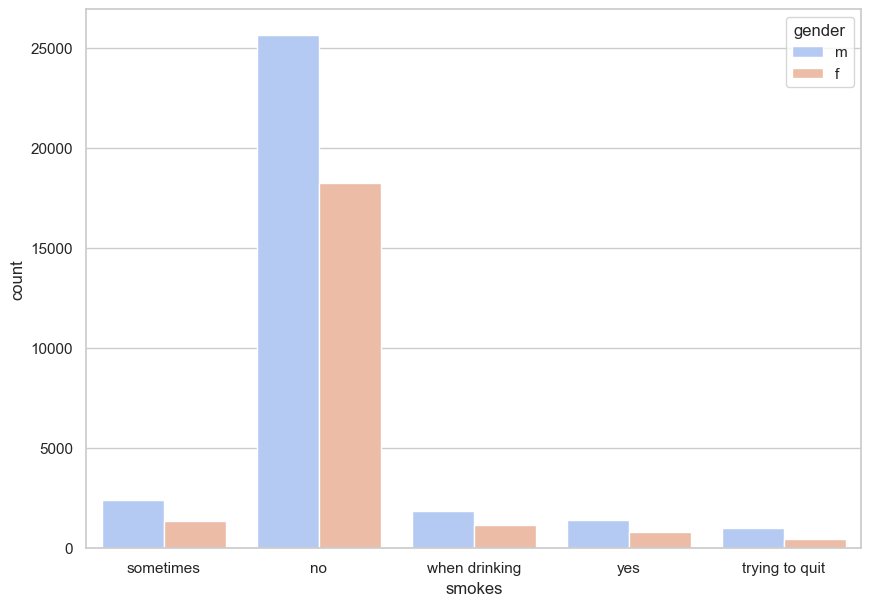

In [22]:
#Checking for smokers 
sns.set_theme(style='whitegrid')
plt.figure(figsize=(10, 7))
ax = sns.countplot(data=df, x=df['smokes'], hue=df['gender'], palette='coolwarm')

Smoking habits can be a real deal breaker for some. Again, the majority of people on OkC are no smokers. 'Sometimes' and 'when drinking' groups are pretty close in size. It might be due to socializing smoking habits. 

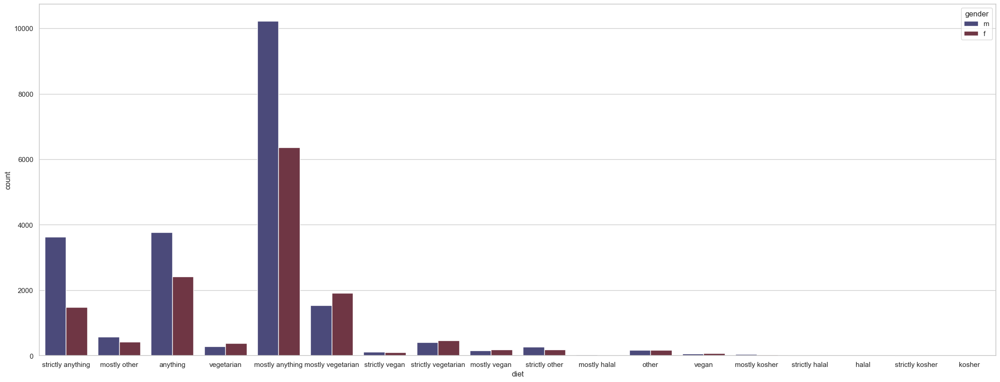

In [23]:
#Diet
sns.set_theme(style='whitegrid')
plt.figure(figsize=(27, 10))
ax = sns.countplot(data=df, x=df['diet'], hue=df['gender'], palette='icefire')

And now the diet. It seems that most users are not picky when it comes to a diet and claim to eat 'mostly anything', 'anything' or 'strictly anything'. Though more women than men say they are 'mostly vegetarian', 'strictly vegetarian' or 'mostly vegan'. Minority user groups eat 'kosher' or 'halal'.

Checking education---- becaue there are many options I chose to not to use a plot to show the data. I devided the data onto men and women groups to check if there are any differences when it comes to their education backroud. 

Most of men on OkC app are educated with the biggest group being 'graduated from college/university'. Then there are 'graduated from masters program' and 'working on college university'. How does it compare with women education trends?
The three biggest education groups for women are the same as men's. But while the forth biggest group for men is 'graduated from high school', for women is 'working on masters program'. 

In [24]:
df.loc[ (df['gender'] =='m')].groupby('education')['gender'].value_counts().sort_values(ascending=False)

education                          gender
graduated from college/university  m         14116
graduated from masters program     m          4698
working on college/university      m          3317
graduated from high school         m          1020
graduated from two-year college    m           987
graduated from ph.d program        m           851
working on masters program         m           819
dropped out of college/university  m           772
working on two-year college        m           715
working on ph.d program            m           644
graduated from law school          m           614
college/university                 m           520
graduated from space camp          m           455
dropped out of space camp          m           394
working on space camp              m           308
graduated from med school          m           239
two-year college                   m           153
working on law school              m           150
dropped out of two-year college    m    

In [25]:
df.loc[ (df['gender'] =='f')].groupby('education')['gender'].value_counts().sort_values(ascending=False)

education                          gender
graduated from college/university  f         9843
graduated from masters program     f         4263
working on college/university      f         2395
working on masters program         f          864
graduated from two-year college    f          544
graduated from law school          f          508
graduated from ph.d program        f          421
graduated from high school         f          408
working on two-year college        f          359
working on ph.d program            f          339
college/university                 f          281
dropped out of college/university  f          223
graduated from med school          f          207
graduated from space camp          f          202
working on space camp              f          137
dropped out of space camp          f          129
working on law school              f          119
working on med school              f          100
two-year college                   f           69
masters 

There is a lot of choice when it comes to ethinicity, some people being multi race. it seems that for both men and women four biggest ethnicity groups are as follows: 'white', 'asian', hispanic/latin' and 'black'.

In [26]:
df.loc[ (df['gender'] =='m')].groupby('ethnicity')['gender'].value_counts().sort_values(ascending=False)

ethnicity                                                                         gender
white                                                                             m         19403
asian                                                                             m          3665
hispanic / latin                                                                  m          1817
black                                                                             m          1126
other                                                                             m          1010
                                                                                            ...  
asian, native american, pacific islander                                          m             1
asian, native american, other                                                     m             1
asian, native american, indian, pacific islander, hispanic / latin, white, other  m             1
asian, native american, india

In [27]:
df.loc[ (df['gender'] =='f')].groupby('ethnicity')['gender'].value_counts().sort_values(ascending=False)

ethnicity                                                                 gender
white                                                                     f         13428
asian                                                                     f          2469
hispanic / latin                                                          f          1006
black                                                                     f           882
other                                                                     f           696
                                                                                    ...  
middle eastern, black, native american, white                             f             1
asian, native american, hispanic / latin, other                           f             1
middle eastern, hispanic / latin, white, other                            f             1
black, native american, pacific islander, hispanic / latin, white, other  f             1
black, native ameri

Now, the offspring... 
The majority of men and women say they 'don't have kids'. More women then men claim that they 'want kids'. Men are more cautions when it comes to the offspring choice, second biggest spike is for men who 'doen't have kids but *might* want them', when for women the second biggest spike is for those who 'don't have kids but *want* them'. Roughly the same number of men and women say they 'have kids' but more women than men say they 'have a kid'. Again there's more women saying that they have 'a kid or kids' and 'do/ don't want to have more'. There's quite a big froup of people declaring they 'don't want kids'. 

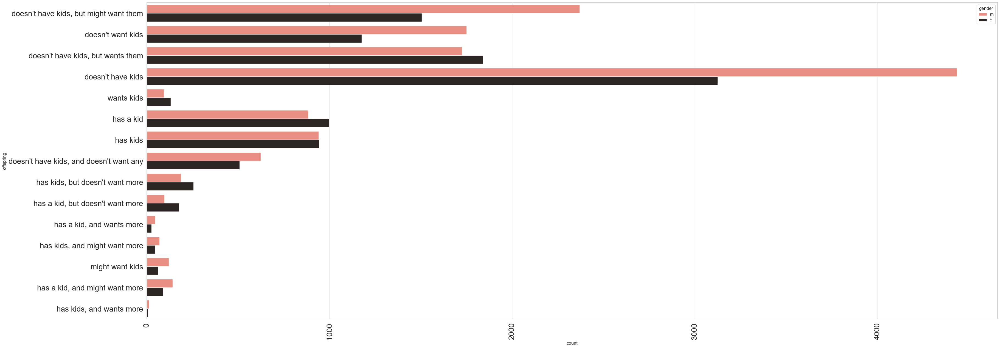

In [28]:
sns.set_theme(style='whitegrid')
plt.figure(figsize=(40, 15))
ax = sns.countplot(data=df, y=df['offspring'], hue=df['gender'], palette='dark:salmon_r')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.setp(ax.get_xticklabels(), rotation=90);

Location can play a big part when it comes to dating. OkC app allows users to broaden the search for a potential match by choosing any location but still most of people want to date someone who lives nearby or at least whiting short travle distance. In this databse the vast majorty of people live in California. 

In [29]:
df['location'].value_counts().sort_values(ascending=False)

san francisco, california       31064
oakland, california              7214
berkeley, california             4212
san mateo, california            1331
palo alto, california            1064
                                ...  
chico, california                   1
south lake tahoe, california        1
vacaville, california               1
miami, florida                      1
rochester, michigan                 1
Name: location, Length: 199, dtype: int64

Pet preferences can be a lesson of compromise. It can also be a deal breaker when it comes to allergies. Let's have a look at the data. 
Most men and women claim that they like both dogs and cats. It seems that women are more of cat lovers, more women than men say they 'have cats' or that they like dogs but 'have cats' or that they have both animals. Guys seem to be more dog lovers, the second biggest grup claiming they 'like dogs' and then that they 'have dogs'. Roughly the  same number of people say they dislike both dogs and cats, dislike only cats or dislike only dogs. More people here dislike cats more than dogs. 

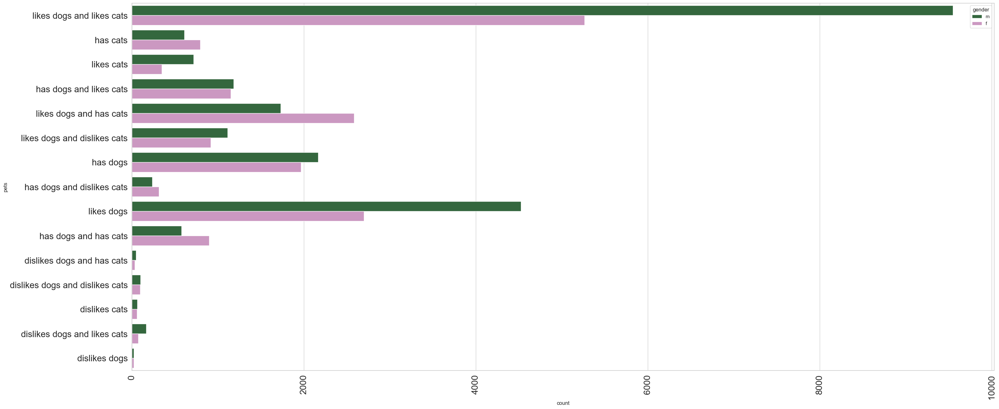

In [30]:
#Checking pet preferences
sns.set_theme(style='whitegrid')
plt.figure(figsize=(35, 15))
ax = sns.countplot(data=df, y=df['pets'], hue=df['gender'], palette='cubehelix')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.setp(ax.get_xticklabels(), rotation=90);

In [31]:
df_inc= df[df['income']>0] 
#there was an income value =-1 for some reson, must be an app setting so I removed is as 
#it doesn't add any information only causing a skew in data.


The income factor can be very important to some people. Let's explore the income trends on OkC app. Most of users of both genders fall into 20000 dollar bracket. What is intesting is that the second biggest spike for men is 100000 dollars while it's 40000 dollars for women. That is quite a difference. Then the next biggest income bracket is 80000 dollars for men and 30000 & 50000 dollars for women. It could be due to the job users have. Let's check that next. 

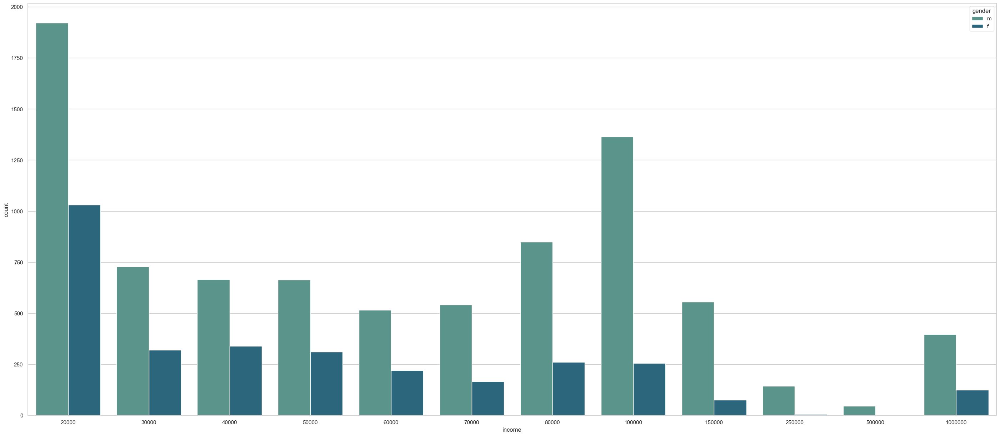

In [32]:
#Income
sns.set_theme(style='whitegrid')
plt.figure(figsize=(35, 15))
ax = sns.countplot(data=df_inc, x=df_inc['income'], hue=df['gender'], palette='crest') 

Because there's quite a difference in an icome let's have a look at users jobs. Three major jobs men chose are: 1. Computer/ hardware/ software, 2. Other (most likely OkC didn't have the specific job listed), 3. Science / tech/ engineering. No surprise that men fall into bigger earning brackets. For women three major job choices are 1. Other, 2. Education/ academia, 3. Medicine/ health. There is quite a big disproportion in number of men and women working in 'compuer' and 'engineering' fields. More women than men have jobs in fields of  in 'Education/ Academia' , 'Medicine/ health' and 'clerical/ administrative'. Interestingly, there's more guys woking in artisting jobs than in banking/ real estate/ financial world. 

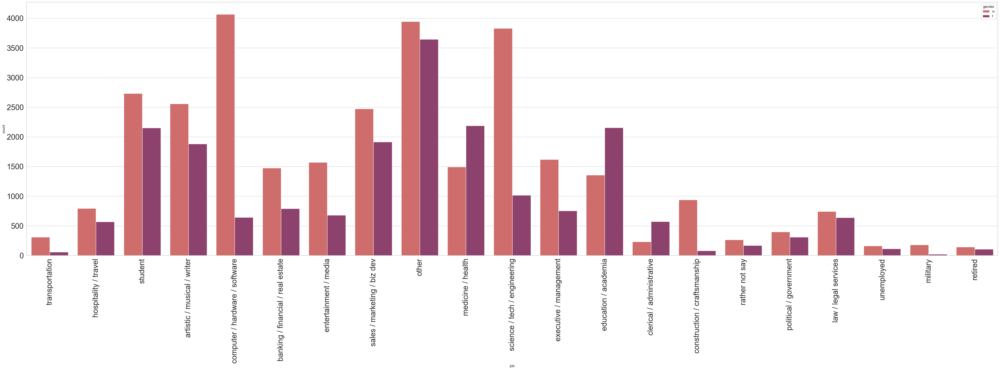

In [33]:
#Job
sns.set_theme(style='whitegrid')
plt.figure(figsize=(57, 15))
ax = sns.countplot(data=df, x=df['job'], hue=df['gender'], palette='flare')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.setp(ax.get_xticklabels(), rotation=90);

Religion is one of the biggest factors for some when looking for a future partner. OkC app allows their users not only to specify what religion sytem they profess but also how important it is in their life - from 'very serious about it' to 'laughing about it'. Majority of men claim to be agnostics and to be either ' not too serious about it' or 'laughing about it'. Most women chose 'other' as the religion option, followed by 'agnositicism'. There are more women chosing 'christianity' and 'judaism' and being more serious about it. Guys then to be less serious about their religion. 

In [34]:
#Checking for religion
df['religion'].value_counts().sort_values(ascending=False)

agnosticism                                   2724
other                                         2691
agnosticism but not too serious about it      2636
agnosticism and laughing about it             2496
catholicism but not too serious about it      2318
atheism                                       2175
other and laughing about it                   2119
atheism and laughing about it                 2074
christianity                                  1957
christianity but not too serious about it     1952
other but not too serious about it            1554
judaism but not too serious about it          1517
atheism but not too serious about it          1318
catholicism                                   1064
christianity and somewhat serious about it     927
atheism and somewhat serious about it          848
other and somewhat serious about it            846
catholicism and laughing about it              726
judaism and laughing about it                  681
buddhism but not too serious ab

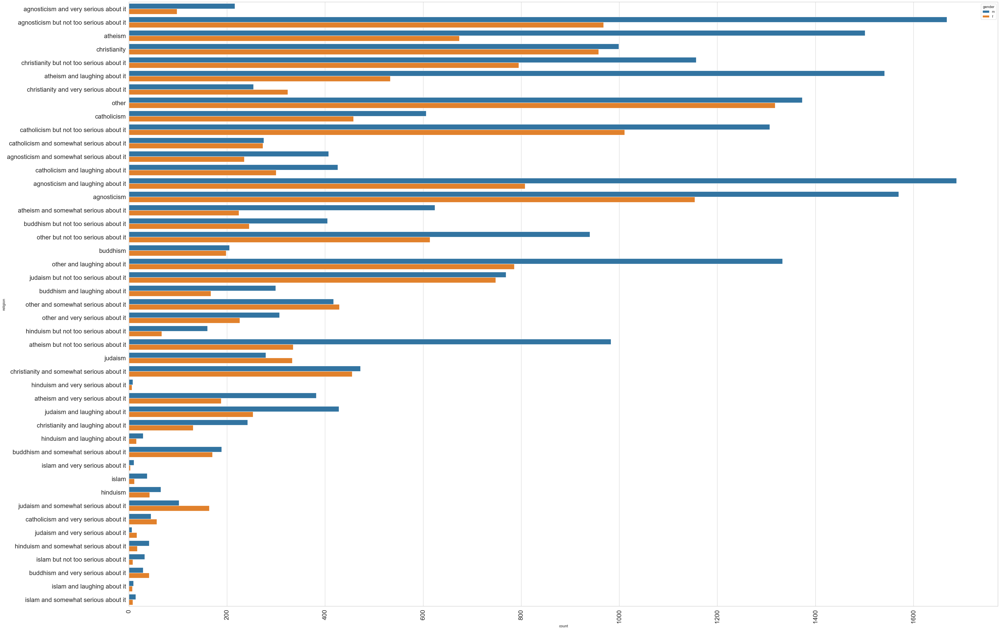

In [35]:
#Religion
sns.set_theme(style='whitegrid')
plt.figure(figsize=(50, 35))
ax = sns.countplot(data=df, y=df['religion'], hue=df['gender'], palette='tab10')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.setp(ax.get_xticklabels(), rotation=90);

## Text pre-processing 

In this part of the project I want to focus on the users essays. I splitted the dataset onto women and men because I want to find out if there is any difference in a choice of words and genral sentiment for both genders. 

In [36]:
#Importing some NLTK packages
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\marta.nawrocka\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\marta.nawrocka\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\marta.nawrocka\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

I don't want to stem words as by doing so we might lose context and it could be misunderstood. Instead I want to lemmatize the words in essay column to keep their original meaning. 

In [37]:
stop_words = set(stopwords.words('english'))

def text_cleaning(text):
    
    #tokenize and convert to lower case
    words = word_tokenize(text.lower())
   
    clean_words = []
    lemmatizer = WordNetLemmatizer()
    
    #I want to lemmatize words instead of the stemming because I want to capture the full meaning not just the stem
    
    # remove stop words & punctuation
    for word in words:
        if word not in stop_words and word.isalpha(): # remove stop words and punctuation 
            clean_words.append(lemmatizer.lemmatize(word)) #lemmatizze words
    

    return " ".join(clean_words)
            

    
            

In [38]:
#nltk.download('omw-1.4')

In [39]:
sentence ='All work and no play makes Jack a dull boy. feet, mice, To be or not to be. ???,,.. Nobody expects the Spanish Inquisition!'
text_cleaning(sentence)
# Function is working fine!

'work play make jack dull boy foot mouse nobody expects spanish inquisition'

In [40]:
#I will work with women's essays first.

ladies_df = df[(df['gender']=='f')]
ladies_df.head()

,age,status,gender,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,job,last_online,location,offspring,pets,religion,sign,smokes,speaks,essay
6,32,single,f,straight,fit,strictly anything,socially,never,graduated from college/university,"white, other",...,NaN,2012-06-25-20-45,"san francisco, california",NaN,likes dogs and likes cats,NaN,virgo,NaN,english,life is about the little things. i love to lau...
7,31,single,f,straight,average,mostly anything,socially,never,graduated from college/university,white,...,artistic / musical / writer,2012-06-29-12-30,"san francisco, california","doesn't have kids, but wants them",likes dogs and likes cats,christianity,sagittarius,no,"english, spanish (okay)","writing. meeting new people, spending time wit..."
8,24,single,f,straight,NaN,strictly anything,socially,NaN,graduated from college/university,white,...,NaN,2012-06-29-23-39,"belvedere tiburon, california",doesn't have kids,likes dogs and likes cats,christianity but not too serious about it,gemini but it doesn&rsquo;t matter,when drinking,english,"oh goodness. at the moment i have 4 jobs, so i..."
13,30,single,f,straight,skinny,mostly anything,socially,never,graduated from high school,white,...,sales / marketing / biz dev,2012-06-13-16-06,"san francisco, california",NaN,has dogs and likes cats,christianity but not too serious about it,NaN,no,english,
14,29,single,f,straight,thin,mostly anything,socially,never,working on college/university,"hispanic / latin, white",...,other,2012-06-29-08-55,"san leandro, california","doesn't have kids, but wants them",likes dogs and has cats,catholicism,taurus,no,english,i have an awesome career working as a senior m...


In [41]:
# Apply the function on essays in our database
ladies_df['essay']=ladies_df['essay'].apply(text_cleaning)

C:\Users\marta.nawrocka\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [42]:
# Checking for 20 most frequent words in ladies' essays 
from collections import Counter
splitted_ladies = (" ".join(ladies_df['essay']).split())
Counter = Counter(splitted_ladies)
most_freq_ladies = Counter.most_common(20)

In [43]:
most_freq_ladies # 'love' is the word that appears most frequently in women's essays

[('love', 62911),
 ('like', 55405),
 ('friend', 39450),
 ('good', 35926),
 ('people', 32050),
 ('thing', 31829),
 ('time', 31567),
 ('life', 30937),
 ('music', 30737),
 ('food', 26508),
 ('movie', 26132),
 ('new', 24874),
 ('also', 22682),
 ('really', 22512),
 ('get', 20225),
 ('book', 19841),
 ('want', 19454),
 ('one', 19451),
 ('know', 19363),
 ('make', 18205)]

 ##### Word Cloud is a data visualization technique used for representing text data in which the size of each word indicates its frequency or importance. Significant textual data points can be highlighted using a word cloud.

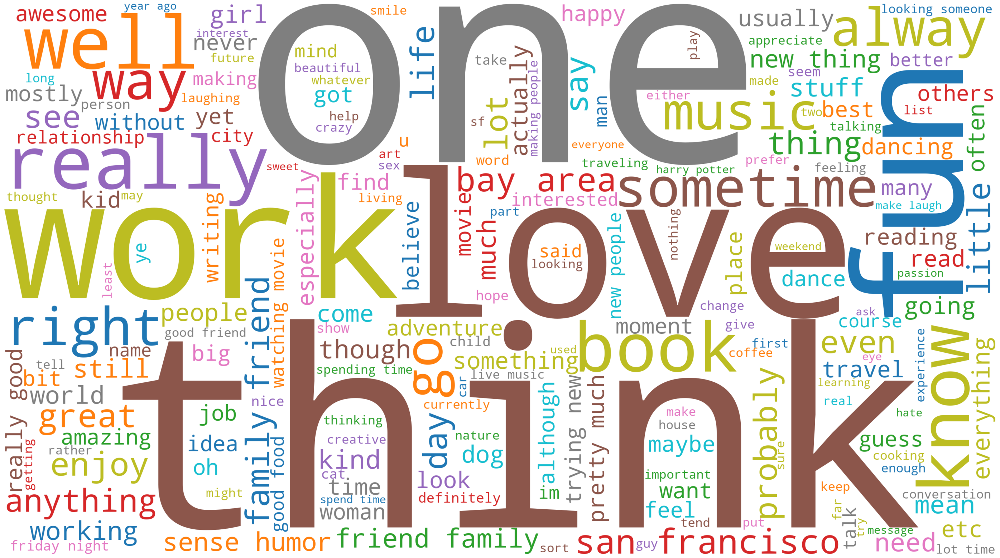

In [44]:
# Word cloud for women's essays


ladies_word_list = [''.join(word) for word in ladies_df['essay']]
ladies_words_as_string = ' '.join(ladies_word_list)

#heart = Image.open('heart.png')
#heart_mask = Image.new(mode='RGB', size = heart.size, color = (255, 255, 255))
#heart_mask.paste(heart, box=heart)

#heart_array = np.array(heart) # converts the image object to an array

word_cloud = WordCloud(width =3600, height =2000, background_color='white', colormap='tab10')
word_cloud.generate(ladies_words_as_string)

plt.figure(figsize=[40,20])
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()

The words that jump out straight at me are: 'work', 'one', 'think', 'well', 'love'. 'San Franciso' and 'Bay Area' are quite noticable too but that's not a surprise sice most users live in California. The word 'work' must be so significant due to the part of essays where people say a little bit about themselves and it usually includes inforamtion about where they work. What I find quite intersting is that I notice the same generic phrases I saw when I was using dating apps. Phrases like, 'spending time with family and friends', 'good food', 'cooking', 'sense of humor', 'love traveling', 'trying new things', 'make people laugh' that say very little about a real person sice most of people like those things.

In [45]:
# Most frequent word combinations for women
from collections import Counter
from nltk.util import ngrams
n_gram = 2
n_gram_dic = dict(Counter(ngrams(ladies_words_as_string.split(), n_gram)))

for i in n_gram_dic:
    if n_gram_dic[i] >= 1000: # apear more than 1000 times
        print(i, n_gram_dic[i])
    

('love', 'laugh') 1260
('spend', 'time') 1518
('love', 'love') 1060
('friday', 'night') 1958
('meeting', 'new') 1145
('new', 'people') 2041
('spending', 'time') 1645
('time', 'friend') 1113
('mad', 'men') 1431
('good', 'book') 1219
('try', 'new') 1157
('food', 'love') 1359
('friend', 'family') 3536
('bay', 'area') 4183
('pretty', 'much') 2599
('favorite', 'book') 1328
('trying', 'new') 2187
('also', 'love') 2234
('new', 'restaurant') 1085
('hanging', 'friend') 1255
('san', 'francisco') 4419
('really', 'good') 2405
('watching', 'movie') 2080
('last', 'year') 1045
('happy', 'hour') 1021
('sense', 'humor') 3479
('new', 'thing') 3132
('wan', 'na') 1087
('good', 'time') 1436
('best', 'friend') 1177
('family', 'friend') 3884
('every', 'day') 1043
('love', 'good') 1147
('really', 'like') 1661
('new', 'friend') 1143
('spend', 'lot') 1123
('lot', 'time') 1604
('make', 'laugh') 1502
('also', 'like') 1632
('modern', 'family') 1191
('would', 'like') 2569
('year', 'ago') 1507
('good', 'friend') 167

In [46]:
# Most frequent word combinations for women
from collections import Counter
from nltk.util import ngrams
n_gram = 3
n_gram_dic = dict(Counter(ngrams(ladies_words_as_string.split(), n_gram)))

for i in n_gram_dic:
    if n_gram_dic[i] >= 200: # apear more than 200 times
        print(i, n_gram_dic[i])

('typical', 'friday', 'night') 581
('meeting', 'new', 'people') 961
('spending', 'time', 'friend') 425
('law', 'order', 'svu') 227
('try', 'new', 'thing') 630
('spend', 'lot', 'time') 1072
('spend', 'much', 'time') 248
('want', 'get', 'know') 360
('good', 'food', 'good') 207
('make', 'world', 'better') 276
('world', 'better', 'place') 294
('meet', 'new', 'people') 679
('trying', 'new', 'restaurant') 447
('yeah', 'yeah', 'yeahs') 291
('tribe', 'called', 'quest') 204
('friday', 'night', 'light') 234
('moved', 'san', 'francisco') 490
('san', 'francisco', 'year') 222
('pretty', 'much', 'anything') 640
('making', 'people', 'feel') 352
('people', 'feel', 'comfortable') 246
('great', 'sense', 'humor') 460
('learning', 'new', 'thing') 422
('love', 'love', 'love') 313
('also', 'really', 'good') 217
('bay', 'area', 'year') 202
('living', 'san', 'francisco') 272
('eternal', 'sunshine', 'spotless') 636
('sunshine', 'spotless', 'mind') 648
('good', 'sense', 'humor') 644
('would', 'like', 'meet') 26

We can get a small insight into women's essays. It seems that 'Harry Potter' series is quite popular. They like hanging out with frinds and family, trying new restaurants, learning new things. 'Meeting new people' or 'great sense of humor' are quite commonly used phrase. 'Mad Men', 'Modern Family', 'There's always sunny in Philadelphia', 'Big Bang Theory', 'Eternal sunshine of a spotless mind' are among most watched series or movies. 

Now I will do the same work on men's essays

In [47]:
men_df = df[(df['gender']=='m')]
men_df.head()

,age,status,gender,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,job,last_online,location,offspring,pets,religion,sign,smokes,speaks,essay
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",...,transportation,2012-06-28-20-30,"south san francisco, california","doesn't have kids, but might want them",likes dogs and likes cats,agnosticism and very serious about it,gemini,sometimes,english,about me: i would love to think that i was so...
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,...,hospitality / travel,2012-06-29-21-41,"oakland, california","doesn't have kids, but might want them",likes dogs and likes cats,agnosticism but not too serious about it,cancer,no,"english (fluently), spanish (poorly), french (...",i am a chef: this is what that means. 1. i am ...
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,...,NaN,2012-06-27-09-10,"san francisco, california",NaN,has cats,NaN,pisces but it doesn&rsquo;t matter,no,"english, french, c++","i'm not ashamed of much, but writing public te..."
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,...,student,2012-06-28-14-22,"berkeley, california",doesn't want kids,likes cats,NaN,pisces,no,"english, german (poorly)",i work in a library and go to school. . .readi...
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",...,artistic / musical / writer,2012-06-27-21-26,"san francisco, california",NaN,likes dogs and likes cats,NaN,aquarius,no,english,hey how's it going? currently vague on the pro...


In [48]:
men_df.shape

(35829, 22)

In [49]:
men_df['essay']=men_df['essay'].apply(text_cleaning) # applying text cleaning function to men's essays

C:\Users\marta.nawrocka\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


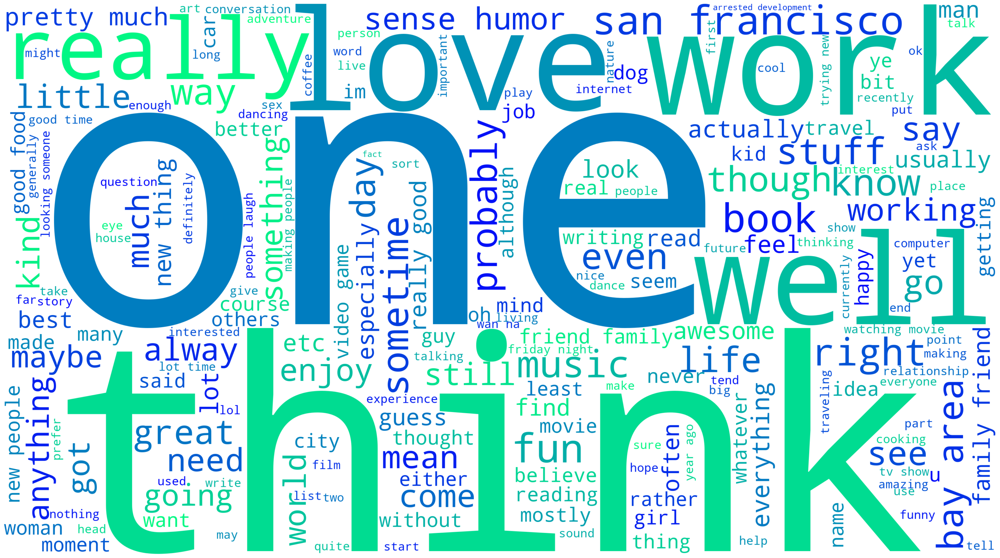

In [50]:
# Word cloud for men's essays 

men_word_list = [''.join(word) for word in men_df['essay']]
men_words_as_string = ' '.join(men_word_list)

word_cloud = WordCloud( width=3600, height=2000, background_color='white', colormap='winter')
word_cloud.generate(men_words_as_string)

plt.figure(figsize=[40,20])
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()

It is worth noticing that the same words are emphesised in both men and women word clouds. It seems that people describing themselves and their interest in a very similar fasion that they think it'll be the most appealing to others. 

In [51]:
# Checking for most frequent words in men's essays 
from collections import Counter
splitted_men = (" ".join(men_df['essay']).split())
Counter = Counter(splitted_men)
most_freq_men = Counter.most_common(20)

In [52]:
most_freq_men # 'like' is the most frequest word. 'Loves' is on the second place. Opposite to women's.  

[('like', 82793),
 ('love', 58058),
 ('good', 51934),
 ('friend', 46262),
 ('thing', 45807),
 ('music', 45564),
 ('time', 44555),
 ('people', 44227),
 ('life', 39849),
 ('movie', 37008),
 ('food', 35724),
 ('new', 32839),
 ('really', 31543),
 ('also', 30886),
 ('get', 30526),
 ('one', 28533),
 ('know', 28196),
 ('want', 27306),
 ('work', 27298),
 ('book', 24353)]

In [53]:
most_freq_ladies  # it seems that both genders use the same words most frequntly 

[('love', 62911),
 ('like', 55405),
 ('friend', 39450),
 ('good', 35926),
 ('people', 32050),
 ('thing', 31829),
 ('time', 31567),
 ('life', 30937),
 ('music', 30737),
 ('food', 26508),
 ('movie', 26132),
 ('new', 24874),
 ('also', 22682),
 ('really', 22512),
 ('get', 20225),
 ('book', 19841),
 ('want', 19454),
 ('one', 19451),
 ('know', 19363),
 ('make', 18205)]

In [54]:
# Most frequent word combinations for men
from collections import Counter
from nltk.util import ngrams
n_gram = 3
n_gram_dic = dict(Counter(ngrams(men_words_as_string.split(), n_gram)))

for i in n_gram_dic:
    if n_gram_dic[i] >= 100:
        print(i, n_gram_dic[i])

('watch', 'lot', 'tv') 118
('music', 'pretty', 'much') 165
('lived', 'san', 'francisco') 166
('san', 'francisco', 'year') 265
('like', 'meeting', 'new') 116
('meeting', 'new', 'people') 1284
('like', 'spend', 'time') 152
('looking', 'meet', 'new') 346
('living', 'san', 'francisco') 407
('like', 'everyone', 'else') 193
('also', 'pretty', 'good') 195
('show', 'met', 'mother') 162
('movie', 'star', 'war') 150
('good', 'making', 'people') 244
('making', 'people', 'smile') 143
('nine', 'inch', 'nail') 263
('making', 'new', 'friend') 328
('year', 'old', 'virgin') 130
('big', 'trouble', 'little') 114
('trouble', 'little', 'china') 113
('dexter', 'breaking', 'bad') 105
('try', 'something', 'new') 210
('dinner', 'drink', 'friend') 157
('wan', 'na', 'hang') 101
('little', 'bit', 'everything') 133
('big', 'bang', 'theory') 839
('know', 'want', 'life') 121
('get', 'know', 'someone') 205
('moved', 'bay', 'area') 541
('play', 'video', 'game') 268
('easy', 'get', 'along') 265
('also', 'really', 'enjo

('meu', 'meu', 'meu') 497
('one', 'thou', 'word') 108
('thou', 'word', 'one') 107
('word', 'one', 'thou') 107
('five', 'hundred', 'word') 177
('hundred', 'word', 'five') 175
('word', 'five', 'hundred') 175


Now let's have a peak in what guys like watching/ doing. Seems that they really like video games. They like watching 'Arrested development', 'Game of throses', 'Star Wars', 'Breaking Bad'. Thye like trying new things and meeting new people. Seems that the shows and movies they list are the same on many profiles. But again, it's very generic writing.

## Sentiment analysis

In this part of the project I want to check the sentiment of essays on OkCupid. I assume a lot of them will be positive as in genral people want to be portraied as happy and positive and easy to get along with. However, in my exparience with dating app there was a number of so called Negative Nancys comlaining about dating app exparince. I want to find out if sentiment alaysis will catch it. 
I'm usisng two sentiment analysis tools: TextBlob and Vader. Both of them are used in NLP for text classification and sentiment analysis. 
TextBlob measures *polarity* and *subjectivity* of a sentence. Polarity range lies between -1 and 1, where -1 means a negative sentiment and 1 very positive sentiment. Subjectivity measures the amount of presonal opinion and factual information contianed in a text. The higher subjectivity means that a give text contains of personal opinion rather than factual information. 
Vader- Valance Aware Dictionary for Sentiment Reasoning is a model used for text sentiment analysis that is sensitive to both polarity (positive/negative) and intensity of emotions. Vader returns a dictionary of scores for each cathegories: positive, neutral, negative, compund, where compund is computed by normaliing the above mentioned scores. 

In [64]:
#Testing TextBlob
testimonial = TextBlob("The food was great!")
print(testimonial.sentiment)

Sentiment(polarity=1.0, subjectivity=0.75)


In [65]:
df['essay']=df['essay'].apply(text_cleaning)

In [66]:
#Vader sentiment metrics of all essays 
df['compound'] = [sid.polarity_scores(e)['compound'] for e in df['essay']]
df['neg'] = [sid.polarity_scores(e)['neg'] for e in df['essay']]
df['neu'] = [sid.polarity_scores(e)['neu'] for e in df['essay']]
df['pos'] = [sid.polarity_scores(e)['pos'] for e in df['essay']]

df['Vader sentiment']=0
df.loc[df['compound']>=0.05, 'Vader sentiment'] = 'Positive' #  genral metrix of measuring the sentiment of the text
df.loc[(df['compound']> -0.05) & (df['compound']<0.05), 'Vader sentiment'] = 'Neutral'
df.loc[df['compound']<=-0.05, 'Vader sentiment'] = 'Negative'

In [67]:
#Text Blob sentiment analysis of all essays 
essay_blob = [TextBlob(essay) for essay in df['essay']]

df['Polarity'] = [b.sentiment.polarity for b in essay_blob]
df['Subjectivity'] = [b.sentiment.subjectivity for b in essay_blob]

df['TextBlob sentiment']=0
df.loc[df['Polarity']> 0, 'TextBlob sentiment'] = 'Positive'
df.loc[(df['Polarity'] == 0), 'TextBlob sentiment'] = 'Neutral'
df.loc[df['Polarity']< 0, 'TextBlob sentiment'] = 'Negative'


In [68]:
df.head()

,age,status,sex,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,speaks,essay,compound,neg,neu,pos,Vader sentiment,Polarity,Subjectivity,TextBlob sentiment
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",...,english,would love think kind intellectual either dumb...,0.9947,0.115,0.588,0.296,Positive,0.123383,0.544341,Positive
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,...,"english (fluently), spanish (poorly), french (...",chef mean workaholic love cook regardless whet...,0.9937,0.110,0.471,0.419,Positive,0.131071,0.565051,Positive
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,...,"english, french, c++",ashamed much writing public text online dating...,0.9982,0.080,0.682,0.238,Positive,0.082291,0.503428,Positive
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,...,"english, german (poorly)",work library go school thing written old dead ...,-0.2732,0.124,0.797,0.080,Negative,0.020000,0.360000,Positive
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",...,english,hey going currently vague profile know come so...,0.9686,0.041,0.662,0.297,Positive,0.079339,0.393595,Positive


In [69]:
data_vader_essay = df['Vader sentiment'].value_counts()
data_vader_essay

Positive    55906
Neutral      2822
Negative     1218
Name: Vader sentiment, dtype: int64

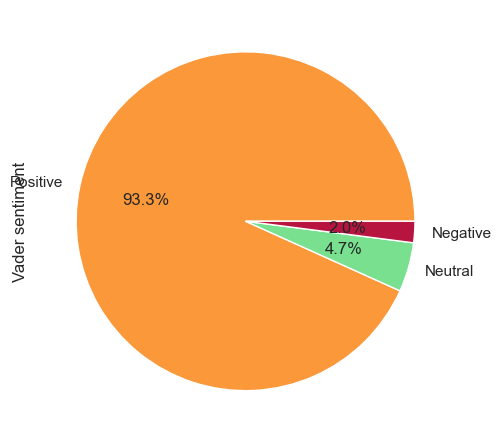

In [70]:
#Vader sentiment plot for all essays
custom_colours = ['#fa983a','#78e08f', '#b71540']
data_vader_essay.plot.pie(autopct="%.1f%%", colors=custom_colours)

As expected Vader classified most of the essays as positive however, there is a small amount of negative ones too. 

In [71]:
TB_essay = df['TextBlob sentiment'].value_counts()
TB_essay

Positive    55003
Neutral      2938
Negative     2005
Name: TextBlob sentiment, dtype: int64

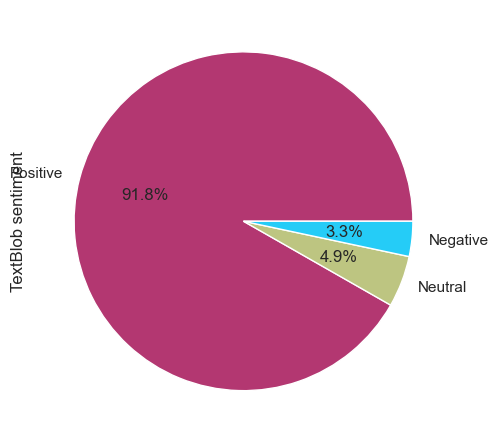

In [72]:
#TextBlob sentiment plot for all essays
custom_colours = ['#B33771','#BDC581', '#25CCF7']
TB_essay.plot.pie(autopct="%.1f%%", colors=custom_colours)


Interestingly, TextBlob classified more essays as negative by 1.3% compared to Vader analysis. Both Vader and TextBlob classified almost exactly the same number of essays as neutral. 

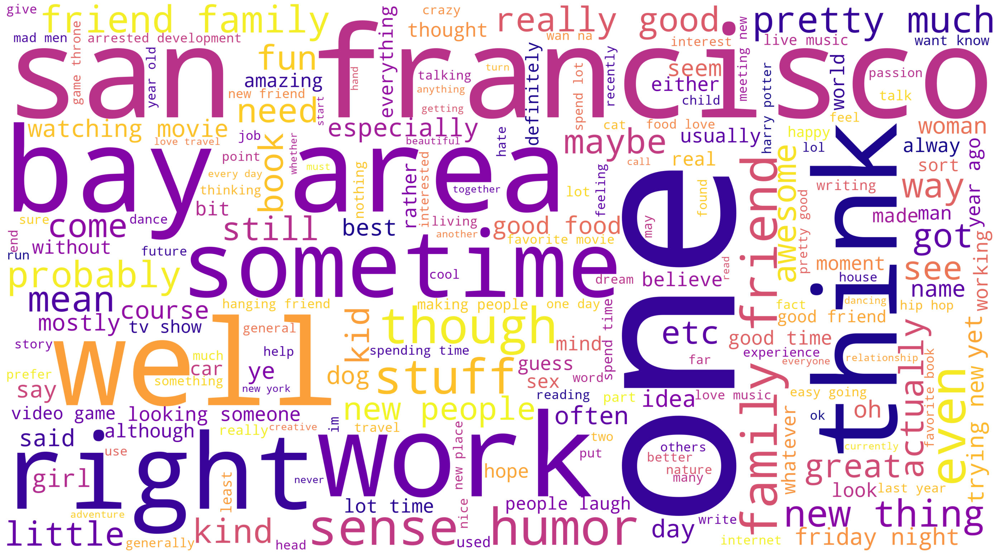

In [73]:
#Here I plot a word cloud for all essays 

word_list = [''.join(word) for word in df['essay']]
words_as_string = ' '.join(word_list)

word_cloud = WordCloud( width=3600, height=2000, background_color='white', colormap='plasma')
word_cloud.generate(words_as_string)

plt.figure(figsize=[40,20])
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [1]:
from collections import Counter
from nltk.util import ngrams
n_gram = 2
n_gram_dic = dict(Counter(ngrams(words_as_string.split(), n_gram)))

for i in n_gram_dic:
    if n_gram_dic[i] >= 1000: # 1000 most common 2-grams in all essays
        print(i, n_gram_dic[i])

NameError: name 'words_as_string' is not defined

# Scraping  Comments from Subreddit OkCupid 

For this part of the project I wanted to see what are real life commnets and feelings about OkCupid app. I chose to use Reddit to scarpe for comments from 1/1/2020 to 1/7/2021. I picked this time frame as it overlapps with global pandemic whern a lot of people found themselves alienated and lonely stuck at home. I also noticed an increasing number of articles in the news stating that it's been a time when number of dating apps users increased due to the fact that it's been very difficult to meet new people in a real life during lockdowns. 
I was interested in Reddit comments because Reddit has a big community of people posting about pretty much about any topic one would be interested in. On Reddit there are sub-Reddits dedicated to a specific topic and one of them is a subreddit called 'OkCupid'. In here people share their real stories and experiance about their dating life and OkCupid app. The good thing is, that on Reddit people come out unfiltered, sharing their real experiance. And so I thought it would be a good place to check pandemic dating app baromoter of emotions and sentiment. 

In [75]:
#Creating reddit credentials for scraping 
reddit = praw.Reddit(client_id='WSDAdQboHv1e8XbPyAOP2w', client_secret='ro9RSWp-TqU0FP8wqpG01BdScXUq_w', user_agent='OkCupid',
                    username='TheRealMarNaw', password = 'axa11Pihu')

Version 7.0.0 of praw is outdated. Version 7.3.0 was released Thursday June 17, 2021.


In [76]:
#hot_posts = reddit.subreddit('OkCupid').hot(limit=20)
#for post in hot_posts:
    #print(post.title)

In [77]:
#posts = []
#OkC_subreddit = reddit.subreddit('OkCupid')
#for post in OkC_subreddit.top(limit=70000):
    #posts.append([post.title, post.score, post.id, post.subreddit, post.url, post.num_comments, post.selftext, post.created])
#top_posts = pd.DataFrame(posts,columns=['title', 'score', 'id', 'subreddit', 'url', 'num_comments', 'body', 'created'])
#top_posts

In [78]:
#top_posts.to_csv('top_posts_reddit.csv')

In [79]:
#posts= pd.read_csv('top_posts_reddit.csv')

In [80]:
#top_posts.head()

In [81]:
#posts.drop(columns='Unnamed:0')

In [82]:
#posts['body']=posts['body'].apply(text_cleaning)

In [83]:
#from collections import Counter
#splitted_posts = (" ".join(posts['body']).split())
#Counter_posts = Counter(splitted_posts)
#most_freq_posts = Counter_posts.most_common(20)

In [84]:
#counter_posts = Counter(posts_as_string)
#freq_posts = counter_posts.most_common(20)

In [85]:
#from collections import Counter
#from nltk.util import ngrams
#n_gram = 2
#n_gram_dic = dict(Counter(ngrams(posts_as_string.split(), n_gram)))

#for i in n_gram_dic:
   # if n_gram_dic[i] >= 10:
        #print(i, n_gram_dic[i])

In [86]:
#posts['title']=posts['title'].apply(text_cleaning)

In [87]:
#title_list = [''.join(word) for word in posts['title']]
#title_as_string = ' '.join(post_list)

#word_cloud = WordCloud( width=700, height=700, background_color='white', colormap='plasma')
#word_cloud.generate(title_as_string)

#plt.figure(figsize=[8,8])
#plt.imshow(word_cloud, interpolation='bilinear')
#plt.axis('off')
#plt.show()

In [88]:
#sentiment_posts = TextBlob(posts_as_string)
#print(sentiment_posts.sentiment)

In [89]:
#sentiment_titles=TextBlob(title_as_string)
#print(sentiment_titles.sentiment)

In [90]:
pip install pmaw pandas

Note: you may need to restart the kernel to use updated packages.


In [91]:
from pmaw import PushshiftAPI
api= PushshiftAPI()

In [92]:
import datetime as dt
before = int(dt.datetime(2021,7,1,0,0).timestamp())
after = int(dt.datetime(2020,1,1,0,0).timestamp())

In [93]:
# Here I scarpe for 100000 comments on OkCupid subreddit between January 2020 and July 2021. 
#I save the scarpped comments into a csv file for further use so I don't have to do the scraping every time I'm running the code. 

#subreddit='OkCupid'
#limit=100000
#comments = api.search_comments(subreddit=subreddit, limit=limit, before=before, after=after)
#print(f'Retrieved {len(comments)} comments from Pushshift')

#comments_df = pd.DataFrame(comments)

#comments_df.head(20)

#print(comments_df.columns)

#comments_df.to_csv('./okc_comments.csv', header=True, index=False, columns=list(comments_df.axes[1]))

In [94]:
okc_comments_df = pd.read_csv('okc_comments.csv', encoding="latin-1", usecols=['author', 'body']) # I'm only really intersted in the body of the comments

In [95]:
okc_comments_df.head()

,author,body
0,[deleted],[removed]
1,likwitsnake,yes
2,Administrative_Cow_1,When will they cast the first Asian?
3,DoNotPmMeCupcakes,Is this about a specific girl or you're trying...
4,Administrative_Cow_1,"Yeah just let all the Asian guys die alone, ra..."


In [96]:
okc_comments_df['body'].isna().value_counts()

False    100000
Name: body, dtype: int64

In [97]:
print(okc_comments_df.loc[okc_comments_df['body'].apply(lambda x: not isinstance(x, (str)))])

Empty DataFrame
Columns: [author, body]
Index: []


In [98]:
print(okc_comments_df.shape)

(100000, 2)


In [99]:
print('N rows:', okc_comments_df.shape[0])

N rows: 100000


In [100]:
print('N values:', len(okc_comments_df['body']))

N values: 100000


In [101]:
okc_comments_df.apply(lambda col: col.drop_duplicates().reset_index(drop=True))

,author,body
0,[deleted],[removed]
1,likwitsnake,yes
2,Administrative_Cow_1,When will they cast the first Asian?
3,DoNotPmMeCupcakes,Is this about a specific girl or you're trying...
4,LiveOnSteak,"Yeah just let all the Asian guys die alone, ra..."
5,oldkidgrumble,To this day The Fifth Element gives me a boner...
6,SunglassesEmote,Super Solar IPA - itâs ok
7,SaltLeading7,It doesn't factor in at all for me. I'd never ...
8,tac15,Oof that's horrible. What does this site have ...
9,Bentleg,"This scene was my favourite, thought it was hi..."


In [102]:
okc_comments_df['body clean']=okc_comments_df['body'].apply(text_cleaning) # applying text cleaning to the comments
okc_comments_df.head(10)

,author,body,body clean
0,[deleted],[removed],removed
1,likwitsnake,yes,yes
2,Administrative_Cow_1,When will they cast the first Asian?,cast first asian
3,DoNotPmMeCupcakes,Is this about a specific girl or you're trying...,specific girl trying date category woman
4,Administrative_Cow_1,"Yeah just let all the Asian guys die alone, ra...",yeah let asian guy die alone racist
5,LiveOnSteak,To this day The Fifth Element gives me a boner...,day fifth element give boner reason would think
6,oldkidgrumble,Super Solar IPA - itâs ok,super solar ipa ok
7,SunglassesEmote,It doesn't factor in at all for me. I'd never ...,factor never consider paying much date drink b...
8,SaltLeading7,Oof that's horrible. What does this site have ...,oof horrible site hard age limit hard
9,tac15,"This scene was my favourite, thought it was hi...",scene favourite thought hilarious started flex...


In [103]:
#Vader sentiment metrics
okc_comments_df['compound'] = [sid.polarity_scores(v)['compound'] for v in okc_comments_df['body']]
okc_comments_df['neg'] = [sid.polarity_scores(v)['neg'] for v in okc_comments_df['body']]
okc_comments_df['neu'] = [sid.polarity_scores(v)['neu'] for v in okc_comments_df['body']]
okc_comments_df['pos'] = [sid.polarity_scores(v)['pos'] for v in okc_comments_df['body']]

okc_comments_df['Vader sentiment']=0
okc_comments_df.loc[okc_comments_df['compound']>=0.05, 'Vader sentiment'] = 'Positive'
okc_comments_df.loc[(okc_comments_df['compound']> -0.05) & (okc_comments_df['compound']<0.05), 'Vader sentiment'] = 'Neutral'
okc_comments_df.loc[okc_comments_df['compound']<=-0.05, 'Vader sentiment'] = 'Negative'

In [104]:
#TextBlod sentiment metrics
desc_blob = [TextBlob(desc) for desc in okc_comments_df['body']]

okc_comments_df['Polarity'] = [b.sentiment.polarity for b in desc_blob]
okc_comments_df['Subjectivity'] = [b.sentiment.subjectivity for b in desc_blob]

okc_comments_df['TextBlob sentiment']=0
okc_comments_df.loc[okc_comments_df['Polarity']> 0, 'TextBlob sentiment'] = 'Positive'
okc_comments_df.loc[(okc_comments_df['Polarity'] == 0), 'TextBlob sentiment'] = 'Neutral'
okc_comments_df.loc[okc_comments_df['Polarity']< 0, 'TextBlob sentiment'] = 'Negative'


In [105]:
okc_comments_df.head()

,author,body,body clean,compound,neg,neu,pos,Vader sentiment,Polarity,Subjectivity,TextBlob sentiment
0,[deleted],[removed],removed,0.0000,0.000,1.000,0.000,Neutral,0.000,0.000000,Neutral
1,likwitsnake,yes,yes,0.4019,0.000,0.000,1.000,Positive,0.000,0.000000,Neutral
2,Administrative_Cow_1,When will they cast the first Asian?,cast first asian,0.0000,0.000,1.000,0.000,Neutral,0.125,0.166667,Positive
3,DoNotPmMeCupcakes,Is this about a specific girl or you're trying...,specific girl trying date category woman,0.0000,0.000,1.000,0.000,Neutral,0.000,0.125000,Neutral
4,Administrative_Cow_1,"Yeah just let all the Asian guys die alone, ra...",yeah let asian guy die alone racist,-0.8271,0.547,0.331,0.122,Negative,0.000,0.000000,Neutral


In [106]:
#Vader sentiment plot
#sns.set_theme(style='whitegrid')
#plt.figure(figsize=(10, 5))
#ax = sns.countplot(data=okc_comments_df, x=okc_comments_df['Vader sentiment'], palette='dark') 

In [107]:
data_vader = okc_comments_df['Vader sentiment'].value_counts()
data_vader

Positive    45895
Neutral     27911
Negative    26194
Name: Vader sentiment, dtype: int64

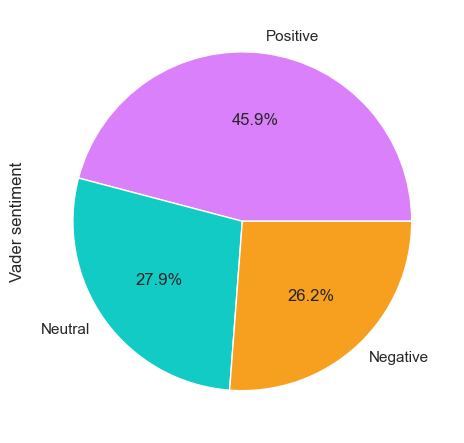

In [108]:
#Vader sentiment plot
custom_colours = ['#D980FA','#12CBC4', '#F79F1F']
data_vader.plot.pie(autopct="%.1f%%", colors=custom_colours)


Less than a half of all comments were classified as positive according to Vader metrics. There are slightly more neutral than negative comments. 
Let's check how TextBlob analysis look like.

In [109]:
#TextBlob sentiment plot
#sns.set_theme(style='whitegrid')
#plt.figure(figsize=(10, 5))
#ax = sns.countplot(data=okc_comments_df, x=okc_comments_df['TextBlob sentiment'], palette='colorblind') 

In [110]:
data_tb = okc_comments_df['TextBlob sentiment'].value_counts()
data_tb

Positive    46788
Neutral     32002
Negative    21210
Name: TextBlob sentiment, dtype: int64

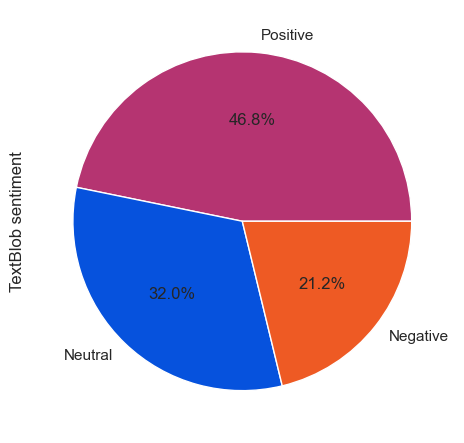

In [111]:
#Text Blob sentiment plot
colours_pie = ['#B53471', '#0652DD', '#EE5A24']
data_tb.plot.pie(autopct="%.1f%%", colors=colours_pie )

Compared to Vader, TextBlob classified more comments as possitive and neutral and less as negative. Overall however, there is not a big diffrences between Vader and Textblob classification of OkCupid comment sentiment.  

In [113]:
# Checking for 20 most frequent words in OkC comments
from collections import Counter
splitted_okc = (" ".join(okc_comments_df['body clean']).split())
Counter_okc = Counter(splitted_okc)
most_freq_okc = Counter_okc.most_common(20)

In [114]:
most_freq_okc

[('like', 21402),
 ('people', 15988),
 ('get', 12082),
 ('one', 9972),
 ('would', 9557),
 ('want', 8838),
 ('time', 8795),
 ('think', 8772),
 ('woman', 8730),
 ('know', 8017),
 ('thing', 7463),
 ('good', 6821),
 ('someone', 6804),
 ('profile', 6765),
 ('make', 6484),
 ('really', 6418),
 ('see', 6190),
 ('date', 6186),
 ('even', 6022),
 ('go', 5775)]

In [119]:
# Most frequent word combinations in OkC comments
from collections import Counter
from nltk.util import ngrams
n_gram = 2
n_gram_dic = dict(Counter(ngrams(okc_as_string.split(), n_gram)))

for i in n_gram_dic:
    if n_gram_dic[i] >= 500: # combitantions of 2 words that appear more than 500 times
        print(i, n_gram_dic[i])

('year', 'old') 531
('gon', 'na') 1173
('look', 'like') 975
('dating', 'apps') 542
('lot', 'people') 513
('dating', 'site') 574
('sound', 'like') 1148
('feel', 'like') 1300
('online', 'dating') 1029
('first', 'date') 622
('http', 'http') 500
('seems', 'like') 522
('people', 'like') 502
('year', 'ago') 632
('amp', 'nbsp') 555
('nbsp', 'amp') 513


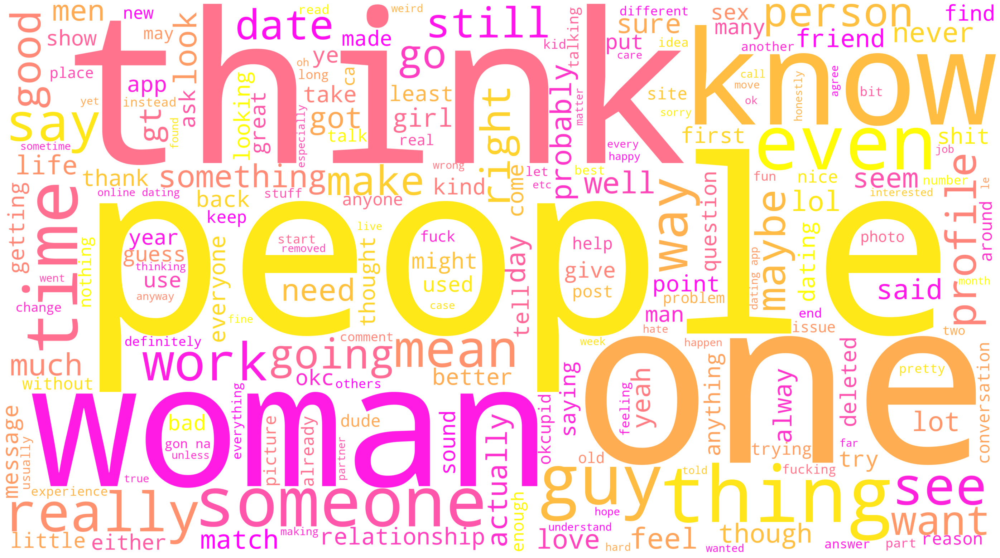

In [118]:
# Word Cloud for OkCupid comments

okc_list = [''.join(word) for word in okc_comments_df['body clean']]
okc_as_string = ' '.join(okc_list)

word_cloud = WordCloud( width=3600, height=2000, background_color='white', colormap='inferno')
word_cloud.generate(okc_as_string)

plt.figure(figsize=[40,20])
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()